In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.pyplot as plot
import seaborn as sns
import wordcloud
import warnings
from collections import Counter
import datetime
import nltk
import random

from nltk.corpus import stopwords
from nltk.util import ngrams
from nltk.tokenize import RegexpTokenizer
#nltk.download()
from nltk.sentiment import SentimentIntensityAnalyzer
import re

In [2]:
# Hiding warnings for cleaner display
warnings.filterwarnings('ignore')

# Configuring some options
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# If you want interactive plots, uncomment the next line
# %matplotlib notebook

In [3]:
df = pd.read_csv('../Documents/youtubedata (2)/YoutubeDataCleaned.csv', encoding='latin-1')

In [4]:
df_category = pd.read_csv('../Documents/youtubedata (2)/Category Names.csv')

In [5]:
df_dummy = pd.merge(df, df_category, how='outer', left_on = 'category_id', right_on = 'id')

In [6]:
df_dummy.drop(columns=['id'],inplace=True)

In [7]:
df_dummy.head(5)

,CITY,STATE,COUNTRY,trending_date,title,Channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,Category Name
0,Covington,KY,USA,18.25.02,Cheap Thrills - Sia / Tina Boo Choreography,1MILLION Dance Studio,24.0,2018-02-19T12:00:02.000Z,"choreography""|""1million dance studio""|""ìë°ë...",601159.0,27962.0,336.0,444.0,https://i.ytimg.com/vi/QRq0pkr2TWM/default.jpg,False,False,False,Entertainment
1,Covington,KY,USA,18.26.02,Cheap Thrills - Sia / Tina Boo Choreography,1MILLION Dance Studio,24.0,2018-02-19T12:00:02.000Z,"choreography""|""1million dance studio""|""ìë°ë...",627933.0,28580.0,340.0,444.0,https://i.ytimg.com/vi/QRq0pkr2TWM/default.jpg,False,False,False,Entertainment
2,Covington,KY,USA,18.01.03,FRIENDS - Marshmello & Anne-Marie / Tina Boo C...,1MILLION Dance Studio,24.0,2018-02-28T09:00:03.000Z,"choreography""|""1million dance studio""|""ìë°ë...",384249.0,26271.0,238.0,540.0,https://i.ytimg.com/vi/_xwX82Y0Oro/default.jpg,False,False,False,Entertainment
3,Covington,KY,USA,18.02.03,FRIENDS - Marshmello & Anne-Marie / Tina Boo C...,1MILLION Dance Studio,24.0,2018-02-28T09:00:03.000Z,"choreography""|""1million dance studio""|""ìë°ë...",513455.0,31505.0,279.0,623.0,https://i.ytimg.com/vi/_xwX82Y0Oro/default.jpg,False,False,False,Entertainment
4,Covington,KY,USA,18.03.03,FRIENDS - Marshmello & Anne-Marie / Tina Boo C...,1MILLION Dance Studio,24.0,2018-02-28T09:00:03.000Z,"choreography""|""1million dance studio""|""ìë°ë...",607740.0,35180.0,314.0,672.0,https://i.ytimg.com/vi/_xwX82Y0Oro/default.jpg,False,False,False,Entertainment


In [8]:
PLOT_COLORS = ["#268bd2", "#0052CC", "#FF5722", "#b58900", "#003f5c"]
pd.options.display.float_format = '{:.2f}'.format
sns.set(style="ticks")
plt.rc('figure', figsize=(8, 5), dpi=100)
plt.rc('axes', labelpad=20, facecolor="#ffffff", linewidth=0.4, grid=True, labelsize=14)
plt.rc('patch', linewidth=0)
plt.rc('xtick.major', width=0.2)
plt.rc('ytick.major', width=0.2)
plt.rc('grid', color='#9E9E9E', linewidth=0.4)
plt.rc('font', family='Arial', weight='400', size=10)
plt.rc('text', color='#282828')
plt.rc('savefig', pad_inches=0.3, dpi=300)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22524 entries, 0 to 22523
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CITY                    22524 non-null  object
 1   STATE                   22524 non-null  object
 2   COUNTRY                 22524 non-null  object
 3   trending_date           22524 non-null  object
 4   title                   22524 non-null  object
 5   Channel_title           22524 non-null  object
 6   category_id             22524 non-null  int64 
 7   publish_time            22524 non-null  object
 8   tags                    22524 non-null  object
 9   views                   22524 non-null  int64 
 10  likes                   22524 non-null  int64 
 11  dislikes                22524 non-null  int64 
 12  comment_count           22524 non-null  int64 
 13  thumbnail_link          22524 non-null  object
 14  comments_disabled       22524 non-null  bool  
 15  ra

#### We can see that there are 22524 entries in the dataset. We can see also that all columns in the dataset are complete (i.e. they have 22524 non-null entries) 

### Dataset collection years
##### Let's see in which years the dataset was collected

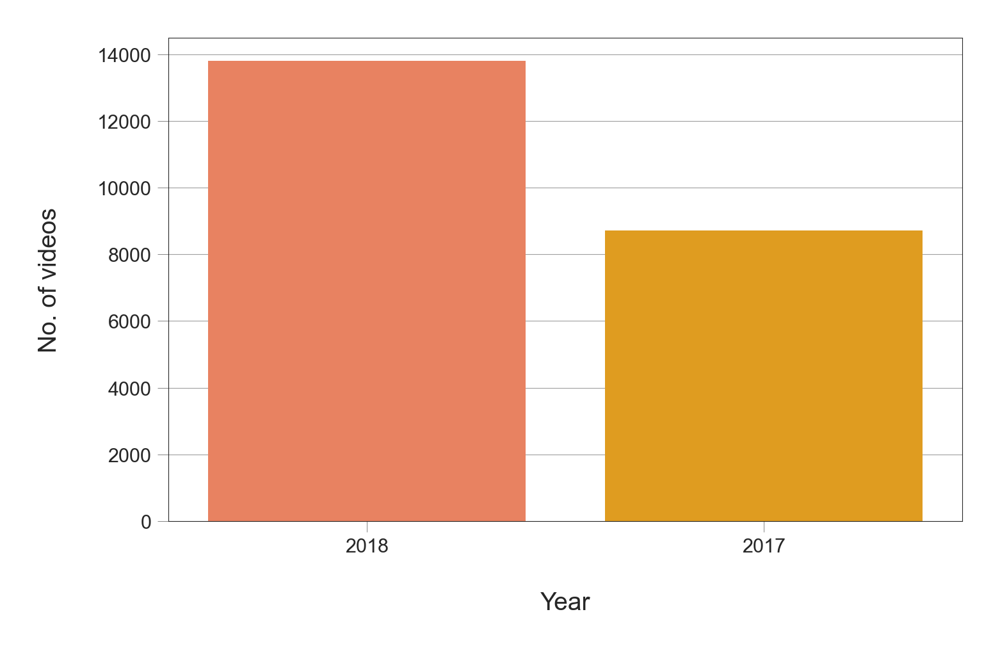

In [10]:
cdf = df["trending_date"].apply(lambda x: '20' + x[:2]).value_counts() \
            .to_frame().reset_index() \
            .rename(columns={"index": "year", "trending_date": "No_of_videos"})

fig, ax = plt.subplots()
_ = sns.barplot(x="year", y="No_of_videos", data=cdf, 
                palette=sns.color_palette(['#ff764a', '#ffa600'], n_colors=7), ax=ax)
_ = ax.set(xlabel="Year", ylabel="No. of videos")
plt.savefig('../Documents/youtubedata (2)/dataset.png', dpi=300)

In [11]:
df["trending_date"].apply(lambda x: '20' + x[:2]).value_counts(normalize=True)

2018   0.61
2017   0.39
Name: trending_date, dtype: float64

#### We can see that the dataset was collected in 2017 and 2018 with 61% of it in 2018 and 39% in 2017.

### Describtion of numerical columns
##### Now, let's see some statistical information about the numerical columns of our dataset

In [12]:
df.describe()

,category_id,views,likes,dislikes,comment_count
count,22524.00,22524.00,22524.00,22524.00,22524.00
mean,20.16,1329987.08,46202.51,2321.05,5532.50
std,7.62,4242973.22,147351.43,25954.70,23574.72
min,1.00,549.00,0.00,0.00,0.00
25%,17.00,127517.75,2547.00,115.00,352.00
50%,24.00,376715.50,10778.00,380.00,1190.00
75%,25.00,1116801.00,32743.75,1225.00,3695.25
max,43.00,149376127.00,3093544.00,1643059.00,827755.00


#### We note from the table above that

##### The average number of views of a trending video is 1329987. The median value for the number of views is 376715, which means that half the trending videos have views that are less than that number, and the other half have views larger than that number
##### The average number of likes of a trending video is 46202, while the average number of dislikes is 2321. 
##### The average comment count is 5532 while the median is 1190.

### Views histogram
#### let's plot a histogram for the views column to take a look at its distribution: to see how many videos have between 10 million and 20 million views, how many videos have between 20 million and 30 million views, and so on.

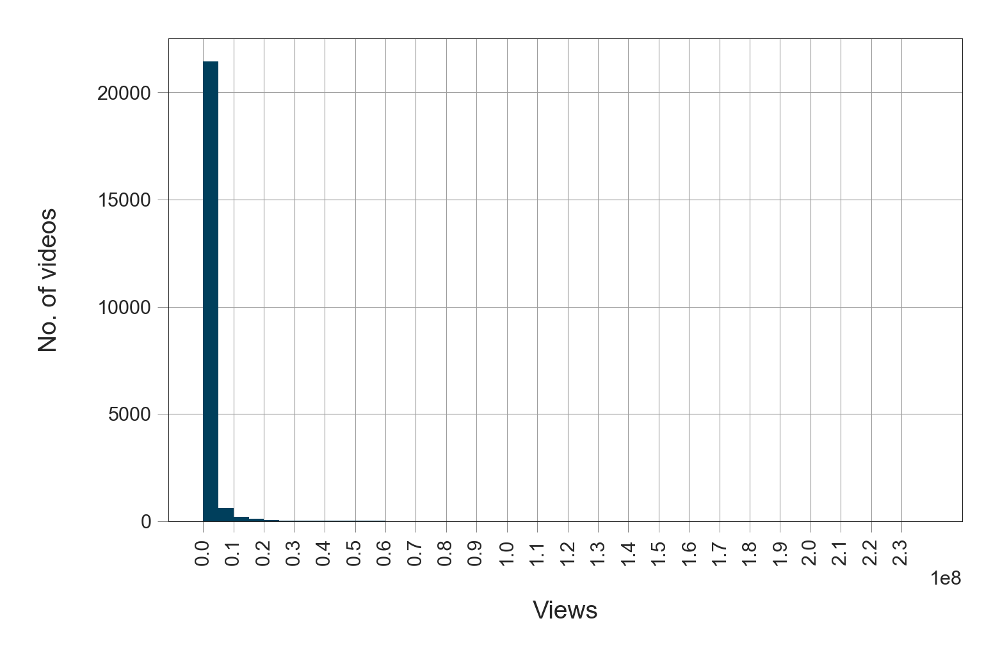

In [13]:
fig, ax = plt.subplots()
_ = sns.distplot(df["views"], kde=False, color=PLOT_COLORS[4], 
                 hist_kws={'alpha': 1}, bins=np.linspace(0, 2.3e8, 47), ax=ax)
_ = ax.set(xlabel="Views", ylabel="No. of videos", xticks=np.arange(0, 2.4e8, 1e7))
_ = ax.set_xlim(right=2.5e8)
_ = plt.xticks(rotation=90)

##### Now let us plot the histogram just for videos with 25 million views or less to get a closer look at the distribution of the data

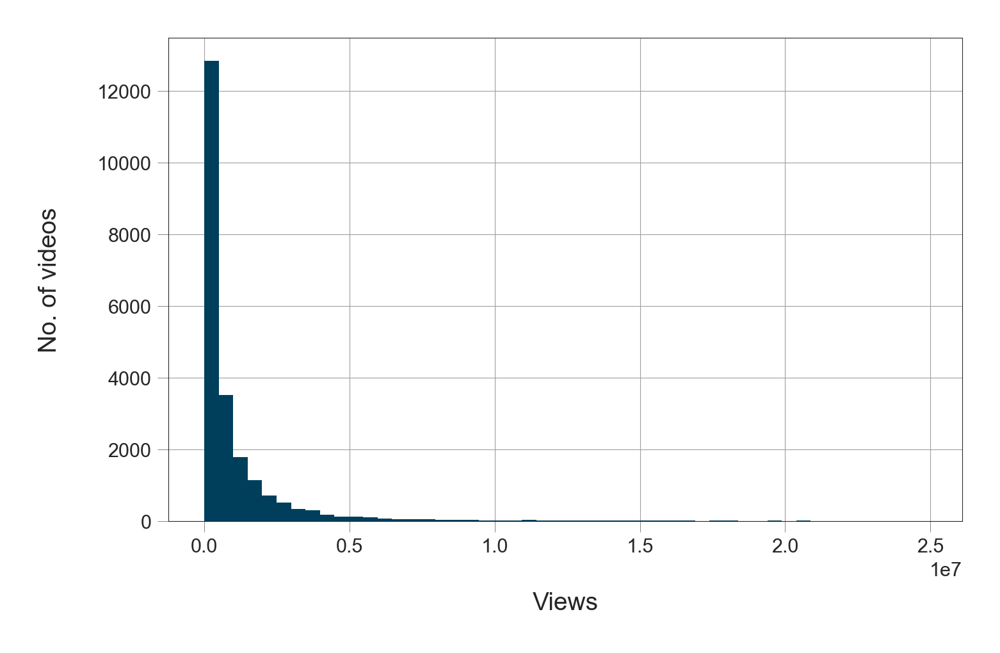

In [14]:
fig, ax = plt.subplots()
_ = sns.distplot(df[df["views"] < 25e6]["views"], kde=False, 
                 color=PLOT_COLORS[4], hist_kws={'alpha': 1}, ax=ax)
_ = ax.set(xlabel="Views", ylabel="No. of videos")
plt.savefig('../Documents/youtubedata (2)/views.png', dpi=300)

#### Now we see that the majority of trending videos have 1 million views or less. Let's see the exact percentage of videos less than 1 million views

In [15]:
df[df['views'] < 1e6]['views'].count() / df['views'].count() * 100

72.71354999112059

In [16]:
df[df['views'] < 5e6]['views'].count() / df['views'].count() * 100

95.24951163203694

##### So, it is 72.71% videos have views 1million or less. Similarly,the percentage of videos with less than 5 million views is around 95.2%.

### Likes histogram

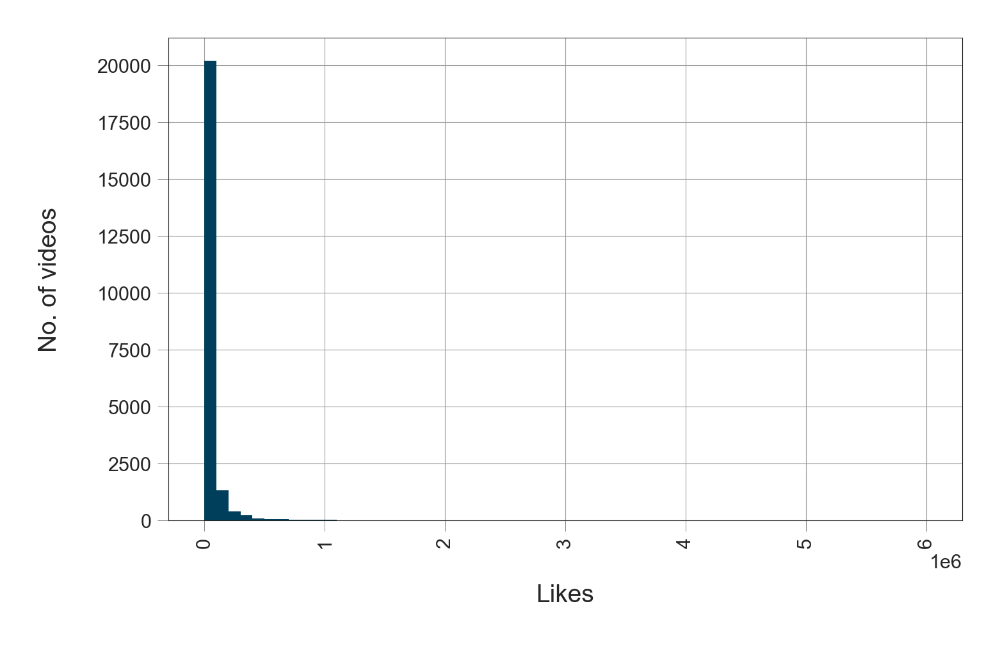

In [17]:
plt.rc('figure.subplot', wspace=0.9)
fig, ax = plt.subplots()
_ = sns.distplot(df["likes"], kde=False, 
                 color=PLOT_COLORS[4], hist_kws={'alpha': 1}, 
                 bins=np.linspace(0, 6e6, 61), ax=ax)
_ = ax.set(xlabel="Likes", ylabel="No. of videos")
_ = plt.xticks(rotation=90)

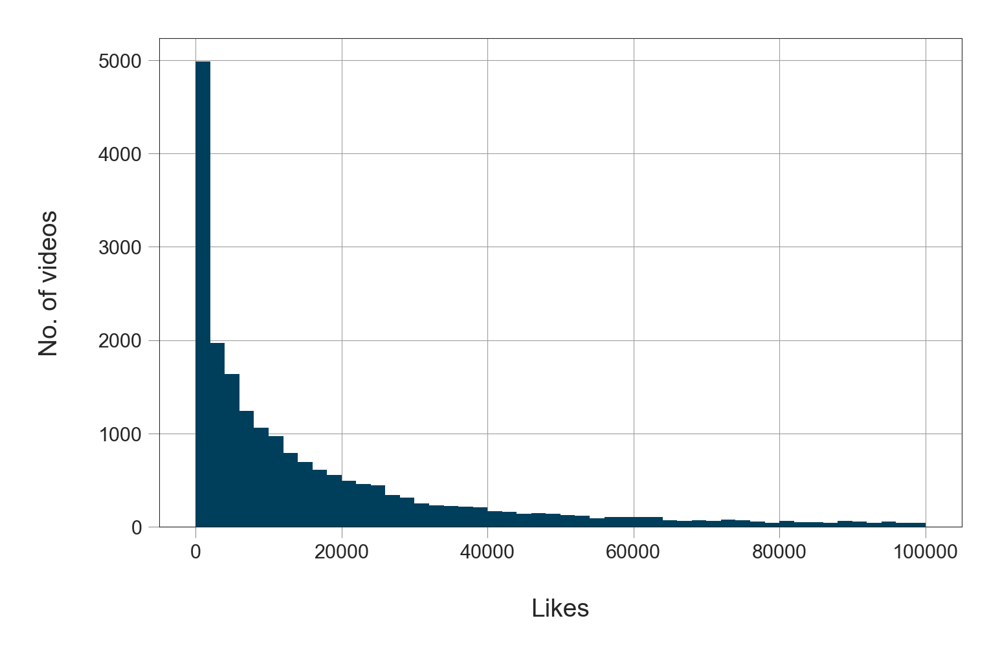

In [18]:
fig, ax = plt.subplots()
_ = sns.distplot(df[df["likes"] <= 1e5]["likes"], kde=False, 
                 color=PLOT_COLORS[4], hist_kws={'alpha': 1}, ax=ax)
_ = ax.set(xlabel="Likes", ylabel="No. of videos")


##### Now we can see that the majority of trending videos have 40000 likes or less.
##### Let's see the exact percentage of videos with less than 40000 likes.

In [19]:
df[df['likes'] < 4e4]['likes'].count() / df['likes'].count() * 100

78.46297282898242

In [20]:
df[df['likes'] < 1e5]['likes'].count() / df['likes'].count() * 100

89.66879772686912

#### So, the percentage of videos with less than 40000 likes is 78.4%. Similarly, we can see that the percentage of videos with less than 100,000 likes is around 89.66%

### Comment count histogram

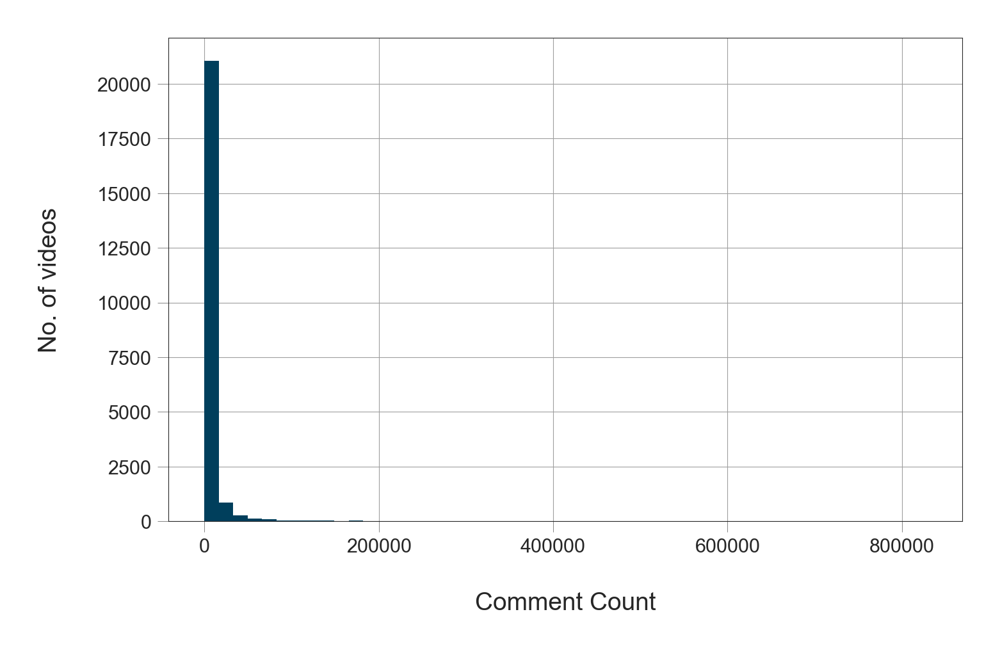

In [21]:
fig, ax = plt.subplots()
_ = sns.distplot(df["comment_count"], kde=False, rug=False, 
                 color=PLOT_COLORS[4], hist_kws={'alpha': 1}, ax=ax)
_ = ax.set(xlabel="Comment Count", ylabel="No. of videos")

#### Let's get a closer look by eliminating entries with comment count larger than 200000 comment

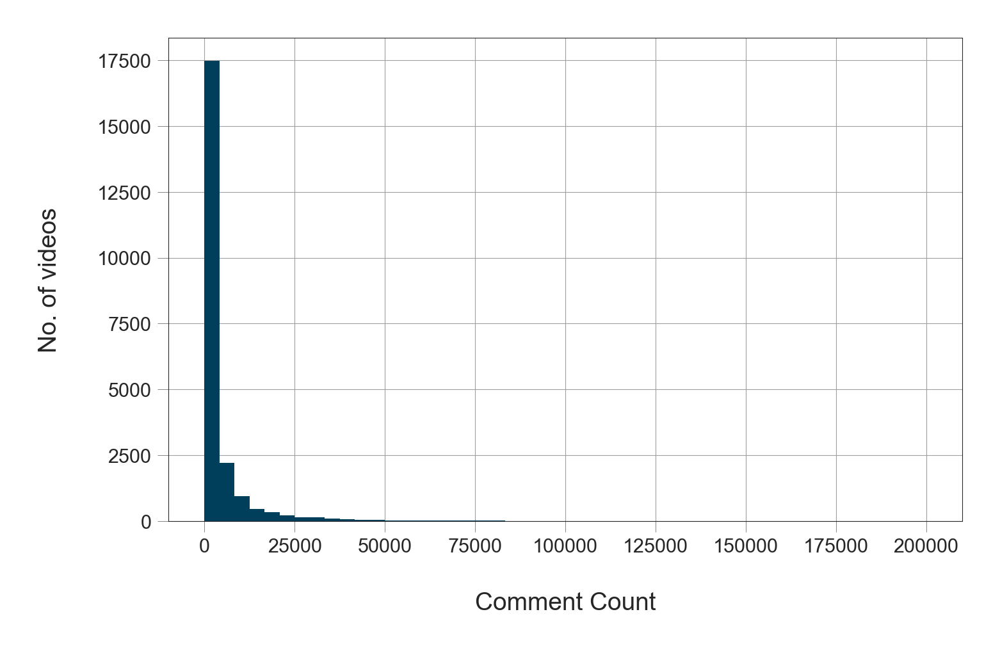

In [22]:
fig, ax = plt.subplots()
_ = sns.distplot(df[df["comment_count"] < 200000]["comment_count"], kde=False, rug=False, 
                 color=PLOT_COLORS[4], hist_kws={'alpha': 1}, 
                 bins=np.linspace(0, 2e5, 49), ax=ax)
_ = ax.set(xlabel="Comment Count", ylabel="No. of videos")

In [23]:
df[df['comment_count'] < 4000]['comment_count'].count() / df['comment_count'].count() * 100

76.74036583200142

In [24]:
df[df['comment_count'] < 25000]['comment_count'].count() / df['comment_count'].count() * 100

95.99982241164979

In [25]:
# correlation matrix between these variables
corr_columns=["views", "likes", "dislikes", "comment_count"]
corr_mtrx=df[corr_columns].corr()
corr_mtrx

,views,likes,dislikes,comment_count
views,1.00,0.79,0.60,0.68
likes,0.79,1.00,0.45,0.83
dislikes,0.60,0.45,1.00,0.66
comment_count,0.68,0.83,0.66,1.00


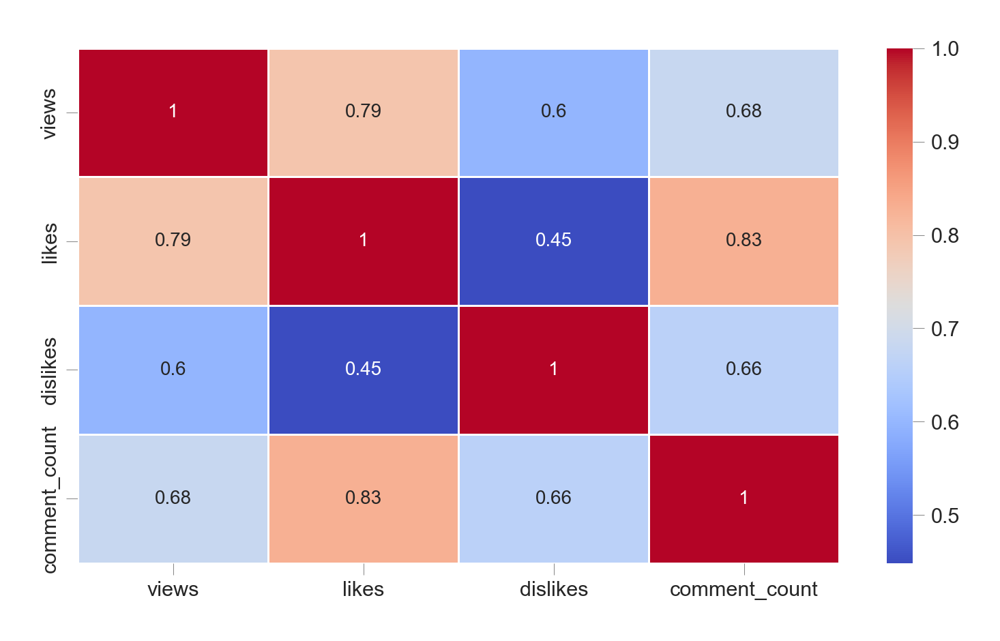

In [26]:
# Draw the heatmap 
plt.figure(figsize = (9,5))
ax = sns.heatmap(corr_mtrx, linewidths=.5, annot=True, cmap='coolwarm')
plt.savefig('../Documents/youtubedata (2)/corr.png', dpi=300)

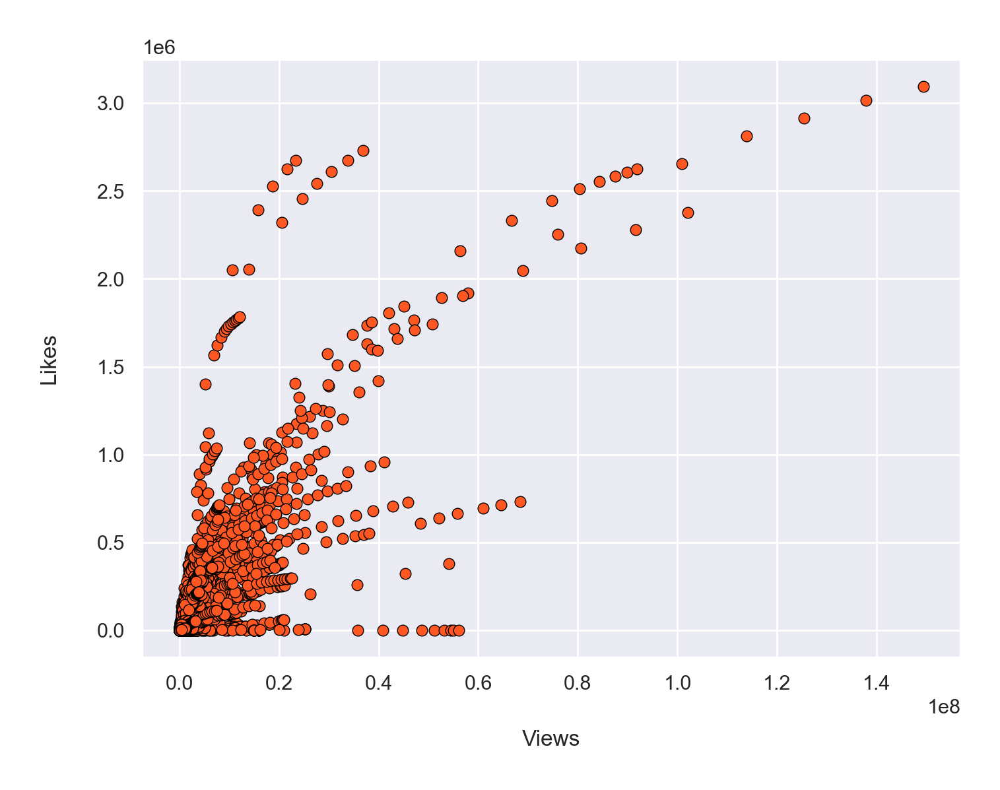

In [27]:
sns.set(rc={'figure.figsize':(8,6)})
fig, ax = plt.subplots()
_ = plt.scatter(x=df['views'], y=df['likes'], color=PLOT_COLORS[2], edgecolors="#000000", linewidths=0.5)
_ = ax.set(xlabel="Views", ylabel="Likes")
plt.savefig('../Documents/youtubedata (2)/views_likes.png', dpi=300)

#### views and likes are truly positively correlated:mostly as one increases, the other increases too

In [28]:
df.describe(include = ['O'])

,CITY,STATE,COUNTRY,trending_date,title,Channel_title,publish_time,tags,thumbnail_link
count,22524,22524,22524,22524,22524,22524,22524,22524,22524
unique,147,50,1,125,4448,1761,4333,4031,4389
top,Atlanta,CA,USA,17.26.11,Maroon 5 - Wait,ESPN,2018-03-07T17:00:02.000Z,[none],https://i.ytimg.com/vi/H0g4JxKp4fc/default.jpg
freq,1871,2861,22524,191,18,122,25,950,16


#### we can see that there are 125 unique dates, which means that our dataset contains collected data about trending videos over 125 days.

In [29]:
# trending video with max view count
df_dummy[df_dummy['views'] == df_dummy['views'].max()].transpose()

,4901
CITY,Orlando
STATE,FL
COUNTRY,USA
trending_date,17.14.12
title,YouTube Rewind: The Shape of 2017 | #YouTubeRe...
Channel_title,YouTube Spotlight
category_id,24.00
publish_time,2017-12-06T17:58:51.000Z
tags,"Rewind""|""Rewind 2017""|""youtube rewind 2017""|""#..."
views,149376127.00


In [30]:
# trending video with max view count
df_dummy[df_dummy['views'] == df_dummy['views'].min()].transpose()

,15444
CITY,San Diego
STATE,CA
COUNTRY,USA
trending_date,18.26.01
title,"1 dead, others injured after Ky. school shooting"
Channel_title,Newsy
category_id,25.00
publish_time,2018-01-23T15:30:01.000Z
tags,"shooting""|""kentucky""|""breaking news""|""u.s. new..."
views,549.00


### Which channels have the largest number of trending videos?

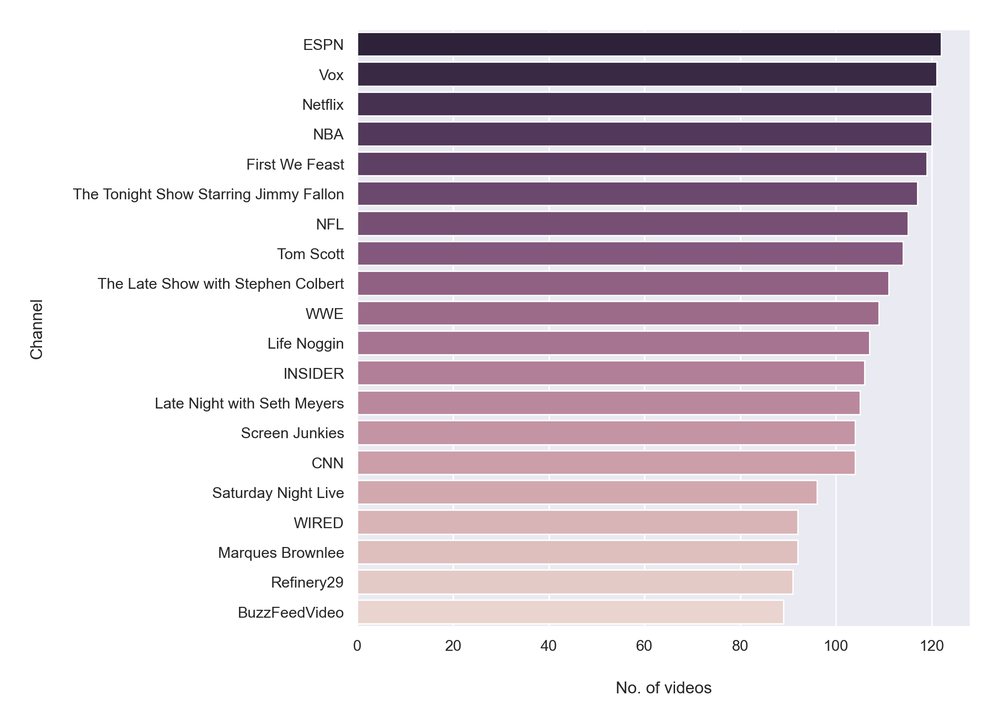

In [31]:
cdf = df.groupby("Channel_title").size().reset_index(name="video_count") \
    .sort_values("video_count", ascending=False).head(20)

fig, ax = plt.subplots(figsize=(8,8))
_ = sns.barplot(x="video_count", y="Channel_title", data=cdf,
                palette=sns.cubehelix_palette(n_colors=20, reverse=True), ax=ax)
_ = ax.set(xlabel="No. of videos", ylabel="Channel")
plt.savefig('../Documents/youtubedata (2)/channel.png', dpi=300)

In [32]:
cdf

,Channel_title,video_count
429,ESPN,122
1554,Vox,121
1007,Netflix,120
978,NBA,120
486,First We Feast,119
1424,The Tonight Show Starring Jimmy Fallon,117
985,NFL,115
1476,Tom Scott,114
1395,The Late Show with Stephen Colbert,111
1563,WWE,109


### Most common words in video titles
##### Let's see if there are some words that are used significantly in trending video titles. We will display the 25 most common words in all trending video titles

In [33]:
title_words = list(df["title"].apply(lambda x: x.split()))
title_words = [x for y in title_words for x in y]
Counter(title_words).most_common(25)

[('-', 5930),
 ('|', 5595),
 ('The', 3496),
 ('the', 2033),
 ('a', 1410),
 ('in', 1392),
 ('to', 1373),
 ('of', 1352),
 ('A', 1298),
 ('&', 1068),
 ('I', 1044),
 ('How', 985),
 ('and', 963),
 ('with', 920),
 ('Trailer', 902),
 ('Official', 814),
 ('2018', 780),
 ('on', 777),
 ('Video)', 685),
 ('To', 671),
 ('2017', 617),
 ('You', 602),
 ('(Official', 587),
 ('for', 581),
 ('In', 499)]

#### Let's draw a word cloud for the titles of our trending videos, which is a way to visualize most common words in the titles; the more common the word is, the bigger its font size is

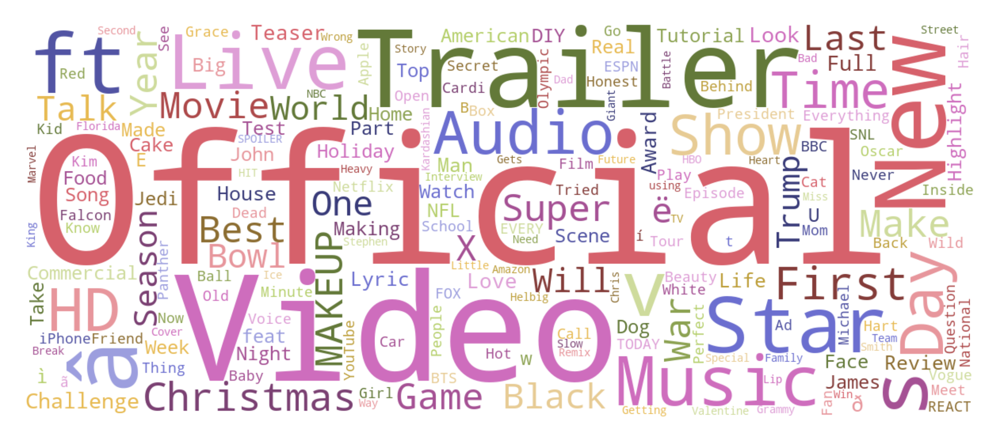

In [34]:
wc = wordcloud.WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(title_words))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")
plt.savefig('../Documents/youtubedata (2)/title.png', dpi=300)

### Most common words in video tags

In [35]:
# source: https://stackoverflow.com/questions/19790188/expanding-english-language-contractions-in-python
contractions = { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"I'd": "I had / I would",
"I'd've": "I would have",
"I'll": "I shall / I will",
"I'll've": "I shall have / I will have",
"I'm": "I am",
"I've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

nltk.download('stopwords')

# if a contraction has more than one possible expanded forms, we replace it 
# with a list of these possible forms
tmp = {}
for k,v in contractions.items():
    if "/" in v:
        tmp[k] = [x.strip() for x in v.split(sep="/")]
    else:
        tmp[k] = v
contractions = tmp

tokenizer = RegexpTokenizer(r"[\w']+")

all_titles = ' '.join([x.lower() for x in df['title']])
for k,v in contractions.items():
    if isinstance(v, list):
        v = random.choice(v)
    all_titles = all_titles.replace(k.lower(), v.lower())
    
words = list(tokenizer.tokenize(all_titles))
words_excl_stopwords = [x for x in words if x not in stopwords.words('english')]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Sushree\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Let's draw a word cloud for the tags of our trending videos

In [36]:
df['num_tags'] = df['tags'].apply(lambda x: len(x.split('|')) if x != '[none]' else 0)
df['tags_length'] = df['tags'].apply(lambda x: len(x.replace('|', '')) if x != '[none]' else 0)

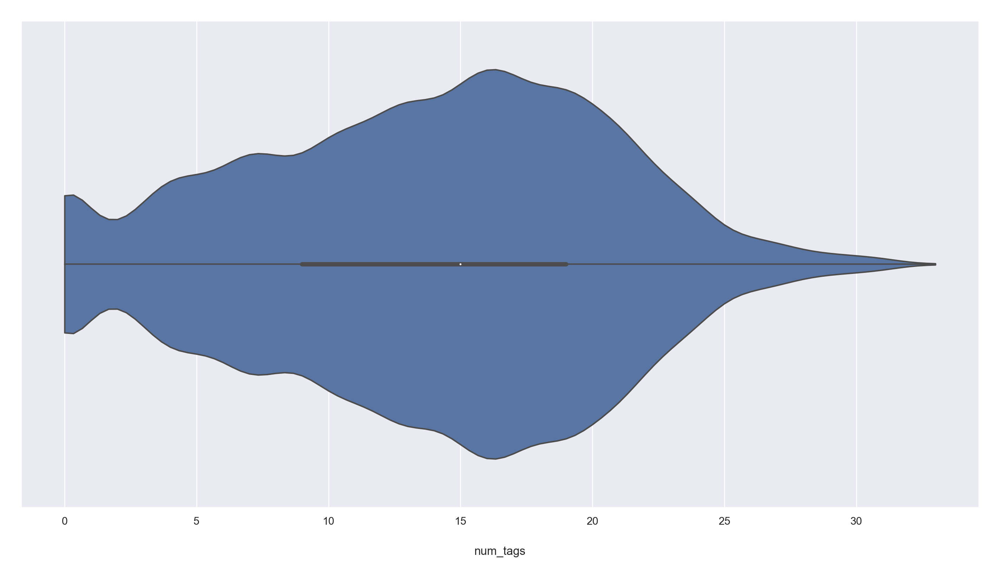

In [37]:
fig, ax = plt.subplots(figsize=(14,8))
sns.violinplot(df['num_tags'], inner='box', cut=0, ax=ax)
#plot_conf(ax, xlbl='Number of tags', ticklbl_size=11, lbl_size=12)
plt.tight_layout()
plt.savefig('../Documents/youtubedata (2)/tagsv.png', dpi=300)

In [38]:
df['num_tags'].describe()

count   22524.00
mean       13.79
std         6.74
min         0.00
25%         9.00
50%        15.00
75%        19.00
max        33.00
Name: num_tags, dtype: float64

In [39]:
100 * df[df['num_tags'] == 0].shape[0] / df.shape[0]

4.217723317350382

In [40]:
df['tags_length'].describe()

count   22524.00
mean      171.61
std        79.05
min         0.00
25%       104.00
50%       226.00
75%       237.00
max       249.00
Name: tags_length, dtype: float64

In [41]:
all_tags = ' '.join([x.lower() for x in df['tags'].apply(
    lambda x: x if pd.isnull(x) else ' '.join(x.split('|'))) if x != '[none]'])
for k,v in contractions.items():
    if isinstance(v, list):
        v = random.choice(v)
    all_tags = all_tags.replace(k.lower(), v.lower())
    
tags_words = list(tokenizer.tokenize(all_tags))
tags_words = [x for x in tags_words if x not in stopwords.words('english')]

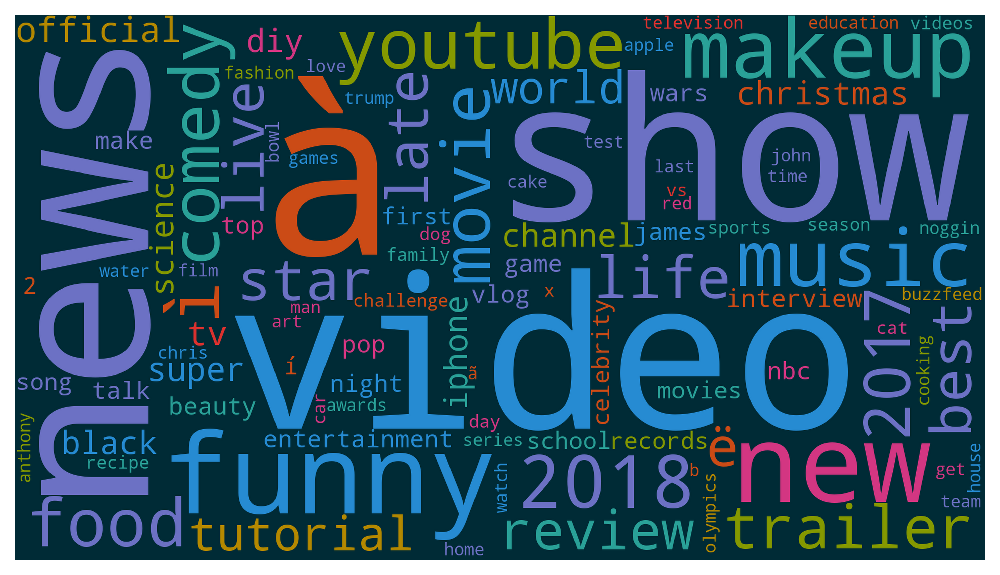

In [42]:
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ['#b58900', '#cb4b16', '#dc322f', '#d33682', '#6c71c4', 
              '#268bd2', '#2aa198', '#859900']
    return colors[len(word)%len(colors)] 

wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, prefer_horizontal=0.9,
                         background_color="#002b36", color_func=col_func, 
                         max_words=100, random_state=7
                        ).generate_from_frequencies(dict(Counter(tags_words)))

fig, ax = plt.subplots(figsize=(19.2,10.8))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)

In [43]:
all_tags = []
for tgs in df['tags']:
    if tgs == '[none]': continue
    all_tags.extend(tgs.split('|'))
tags_freq = pd.Series(all_tags).value_counts().to_dict()

In [44]:
tag_words = list(df["tags"].apply(lambda x: x.split()))
tag_words = [x for y in tag_words for x in y]
Counter(tag_words).most_common(35)

[('the', 2813),
 ('and', 2259),
 ('to', 2187),
 ('of', 1990),
 ('a', 1388),
 ('in', 978),
 ('[none]', 950),
 ('with', 829),
 ('The', 810),
 ('Late', 712),
 ('for', 608),
 ('on', 558),
 ('life', 545),
 ('my', 541),
 ('vs', 486),
 ('&', 461),
 ('is', 454),
 ('make', 434),
 ('you', 432),
 ('youtube"|"youtube', 373),
 ('star', 372),
 ('it', 365),
 ('makeup', 353),
 ('i', 336),
 ('your', 325),
 ('wars', 324),
 ('new', 322),
 ('school', 299),
 ('last', 298),
 ('noggin', 294),
 ('video', 289),
 ('bowl', 286),
 ('music', 284),
 ('perfect', 280),
 ('mythical', 266)]

#### the most common tags used in trending videos which are shown in this word cloud

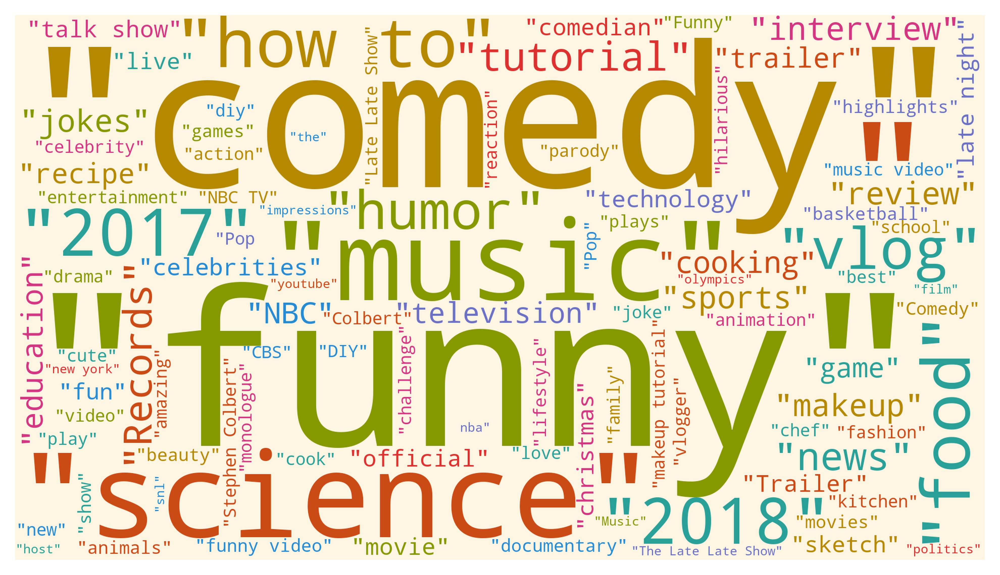

In [45]:
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ['#b58900', '#cb4b16', '#dc322f', '#d33682', '#6c71c4', 
              '#268bd2', '#2aa198', '#859900']
    return colors[len(word)%len(colors)]

wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, prefer_horizontal=0.9,
                         background_color="#fdf6e3", color_func=col_func, 
                         max_words=100, random_state=7
                        ).generate_from_frequencies(tags_freq)

fig, ax = plt.subplots(figsize=(19.2,10.8))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)
plt.savefig('../Documents/youtubedata (2)/tags.png', dpi=300)

In [46]:
sorted(tags_freq.items(), key=lambda x: x[1], reverse=True)[:15]

[('"funny"', 1360),
 ('"comedy"', 1132),
 ('', 722),
 ('"', 638),
 ('"science"', 486),
 ('"music"', 471),
 ('"how to"', 466),
 ('"food"', 450),
 ('"2017"', 443),
 ('"2018"', 422),
 ('"vlog"', 405),
 ('"humor"', 403),
 ('"tutorial"', 386),
 ('"Records"', 366),
 ('"news"', 361)]

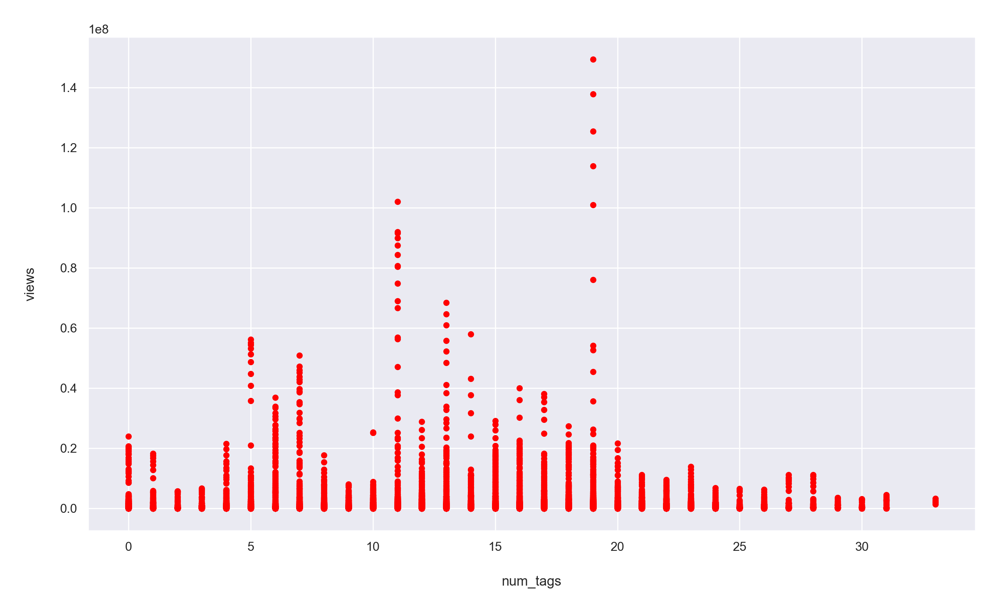

In [47]:
ax = df.plot(kind='scatter', x='num_tags', y='views', figsize=(14,8), color='red')

### Which video category has the largest number of trending videos?

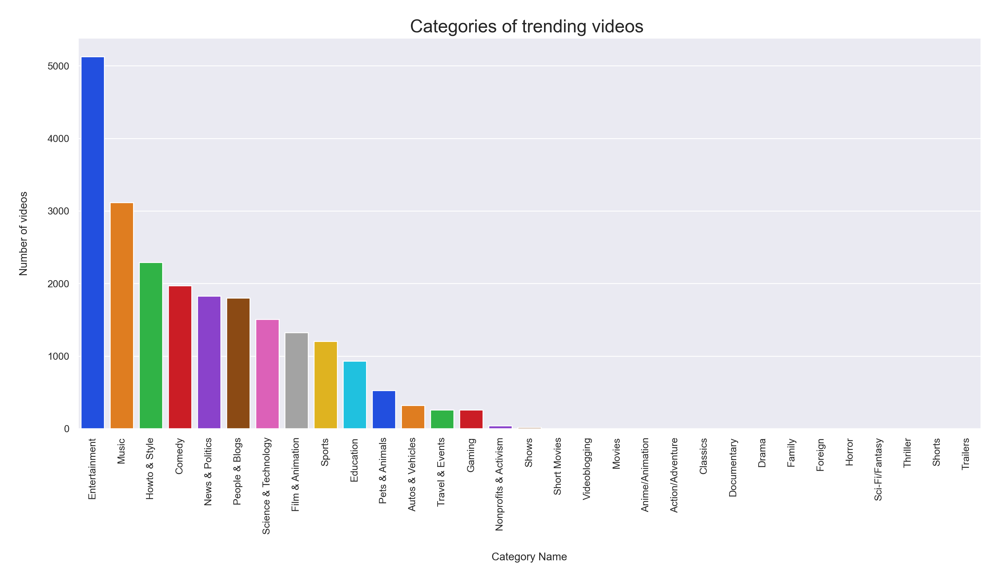

In [48]:
# Counting the video category names
plt.figure(figsize = (18,8))
gr = sns.countplot('Category Name', data=df_dummy, palette="bright", order = df_dummy['Category Name'].value_counts().index)
gr.set_xticklabels(gr.get_xticklabels(),rotation=90)
gr.set_title("Categories of trending videos ", fontsize=20)
gr.set_xlabel("Category Name", fontsize=12)
gr.set_ylabel("Number of videos", fontsize=12)
plt.savefig('../Documents/youtubedata (2)/category.png', dpi=300)

In [49]:
df_dummy['Category Name'].value_counts()

Entertainment            5129
Music                    3115
Howto & Style            2291
Comedy                   1971
News & Politics          1829
People & Blogs           1800
Science & Technology     1505
Film & Animation         1326
Sports                   1205
Education                 933
Pets & Animals            528
Autos & Vehicles          323
Travel & Events           258
Gaming                    257
Nonprofits & Activism      39
Shows                      16
Short Movies                1
Videoblogging               1
Movies                      1
Anime/Animation             1
Action/Adventure            1
Classics                    1
Documentary                 1
Drama                       1
Family                      1
Foreign                     1
Horror                      1
Sci-Fi/Fantasy              1
Thriller                    1
Shorts                      1
Trailers                    1
Name: Category Name, dtype: int64

####  Entertainment category contains the largest number of trending videos among other categories, followed by music.

In [50]:
df_dummy = df_dummy[~df_dummy["Category Name"].isin(['Movies', 'Trailers'])]

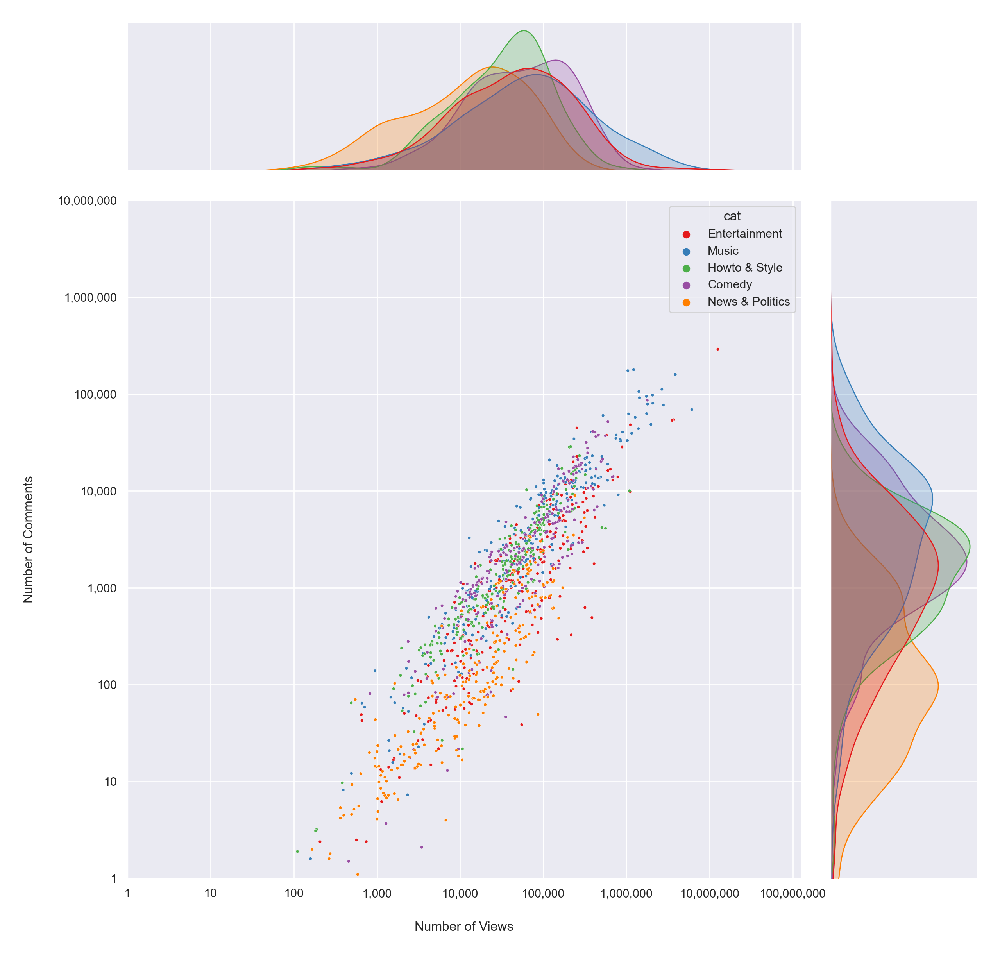

In [51]:
top5Cats = df_dummy["Category Name"].value_counts()[:5].index.tolist()
df_dummy = df_dummy[df_dummy["likes"] > 0] 

allSamples = pd.DataFrame()
i= 0
for cat in top5Cats:
    sample = df_dummy[(df_dummy["Category Name"] == cat)].sample(n=250, random_state=1)
    temp = pd.DataFrame()
    temp["views"] = sample["views"]
    temp["logViews"] = np.log10(temp["views"])    
    temp["likes"] = sample["likes"]
    temp["logLikes"] = np.log10(temp["likes"])    
    temp["dislikes"] = sample["dislikes"]
    temp["comment_count"] = sample["comment_count"]
    temp["cat"] = sample["Category Name"]
    allSamples = allSamples.append(temp)
    

ax = sns.jointplot(x='logViews',y='logLikes',data=allSamples, s=8, hue="cat", kind="scatter", height=12, ratio = 4, palette="Set1")
ax.ax_joint.set_ylim(1,allSamples["logLikes"].max() + 1)
ax.ax_joint.set_xlim(1,allSamples["logViews"].max() + 1)

ax.ax_joint.set_ylabel('Number of Comments')
ax.ax_joint.set_xlabel('Number of Views')
ax.ax_joint.set_xticks([1,2,3,4,5,6,7,8,9])
ax.ax_joint.set_xticklabels(['1','10','100','1,000','10,000','100,000','1,000,000','10,000,000','100,000,000'])
ax.ax_joint.set_yticks([1,2,3,4,5,6,7,8])
ax.ax_joint.set_yticklabels(['1','10','100','1,000','10,000','100,000','1,000,000','10,000,000'])
plt.savefig('../Documents/youtubedata (2)/like_comment.png', dpi=300)

##### As we can see the most viewed and most commented videos are dominated by the musical catagory, however we are only looking at the top 5 catagories by population size.

Text(0, 0.5, 'Views')

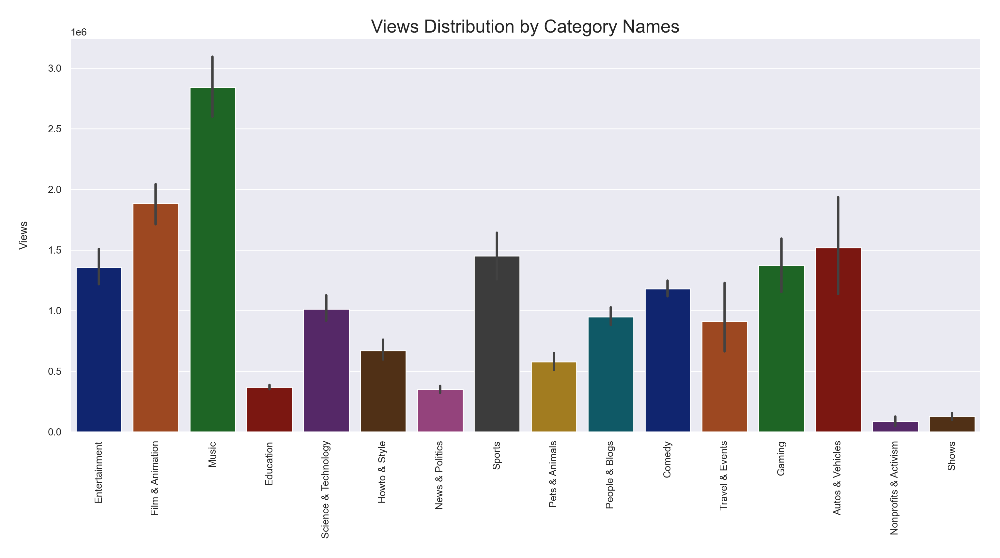

In [52]:

plt.figure(figsize = (18,8))
# Views distribution that shows watch rates of category names
g_v = sns.barplot(x="Category Name", y="views", data=df_dummy, palette="dark")
g_v.set_xticklabels(g_v.get_xticklabels(),rotation=90)
g_v.set_title("Views Distribution by Category Names", fontsize=20)
g_v.set_xlabel("", fontsize=12)
g_v.set_ylabel("Views", fontsize=12)

Text(0, 0.5, 'Category')

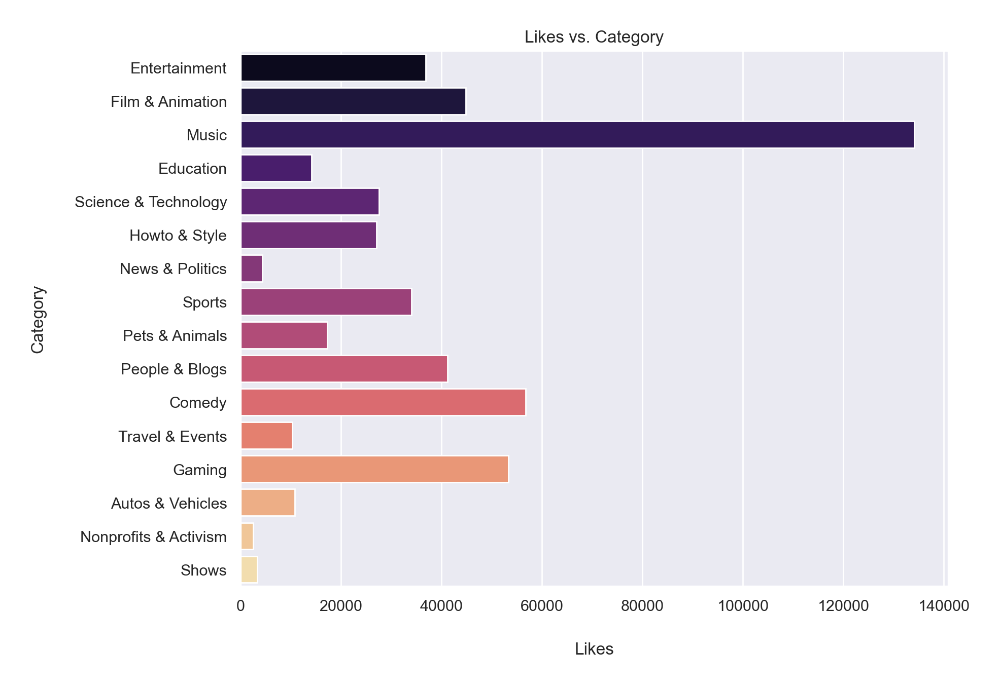

In [53]:
sns.set(rc={'figure.figsize':(9,7)})
ax= sns.barplot(x='likes', y='Category Name', data=df_dummy, ci=False, palette='magma')
plot.title('Likes vs. Category')
plot.xlabel("Likes")
plot.ylabel("Category")

Text(0, 0.5, 'comments')

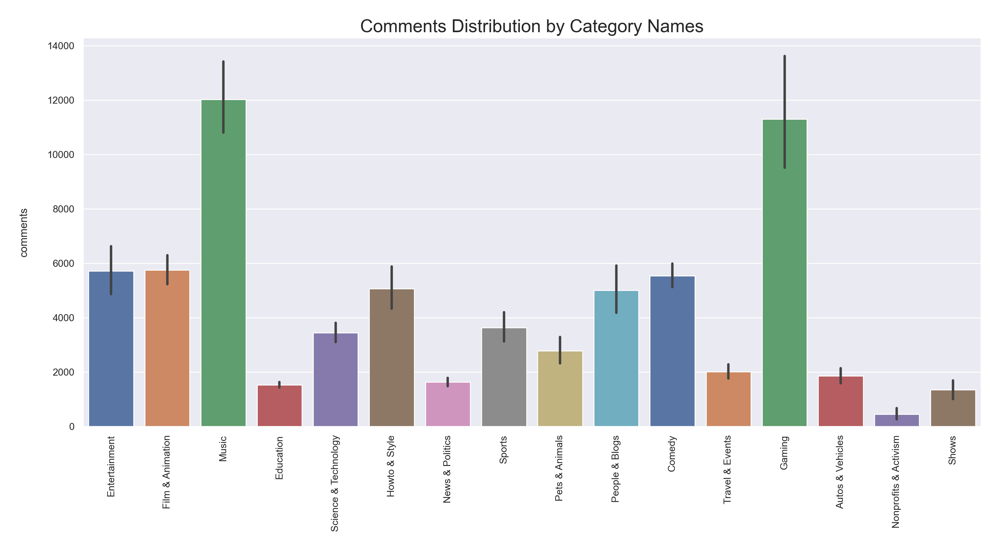

In [54]:
# Comments distribution that shows watch rates of category names
plt.figure(figsize = (18,8))
g_cm = sns.barplot(x="Category Name", y="comment_count", data=df_dummy, palette="deep")
g_cm.set_xticklabels(g_cm.get_xticklabels(),rotation=90)
#g_cm.set(yscale="log")
g_cm.set_title("Comments Distribution by Category Names", fontsize=20)
g_cm.set_xlabel("", fontsize=12)
g_cm.set_ylabel("comments", fontsize=12)

#### Music has the highest number of views, likes and comments in comparison to other categories and Nonprofits & Activism has the lowest views,likes and comments.

Text(0.5, 1.0, 'View Count vs. Comments Disabled')

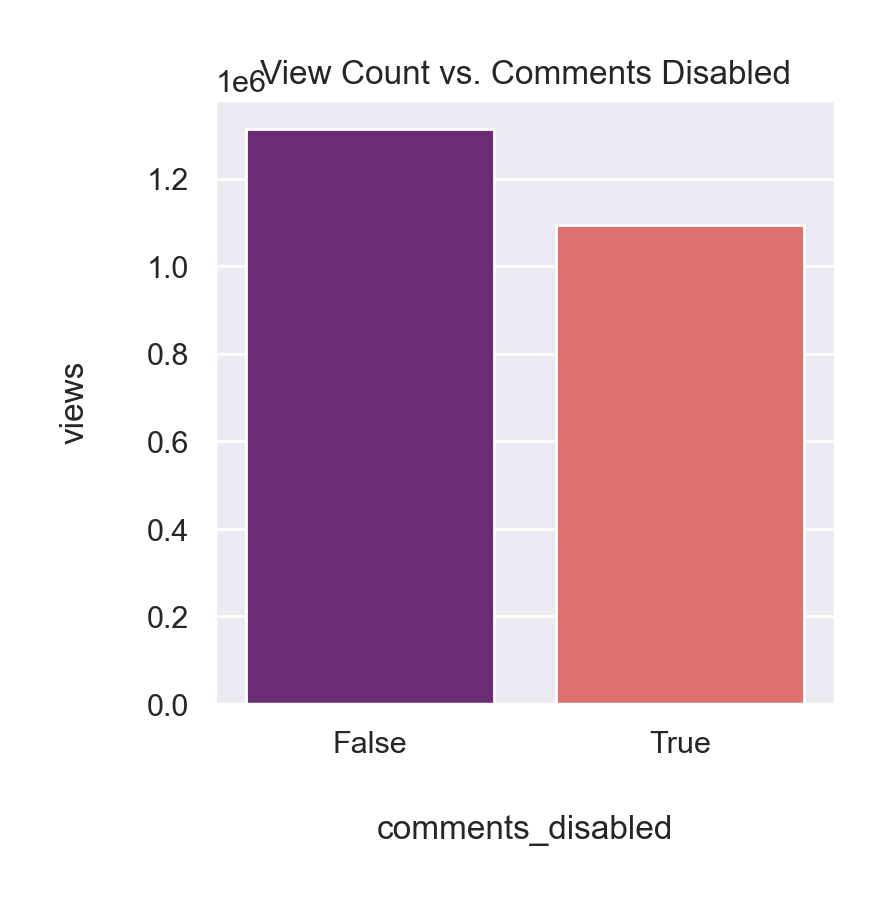

In [55]:
sns.set(rc={'figure.figsize':(4,4)})
sns.barplot(x='comments_disabled', y='views', data=df_dummy, palette='magma', ci= False)
plot.title('View Count vs. Comments Disabled')

 #### the relationship between view count and comments disabled. As it is seen, comments disabled videos had less views.

In [56]:
df_dummy["comments_disabled"].value_counts(normalize=True)

False   0.99
True    0.01
Name: comments_disabled, dtype: float64

#### We see that only 2% of trending videos prevented users from commenting.

### How many trending videos have their ratings disabled?

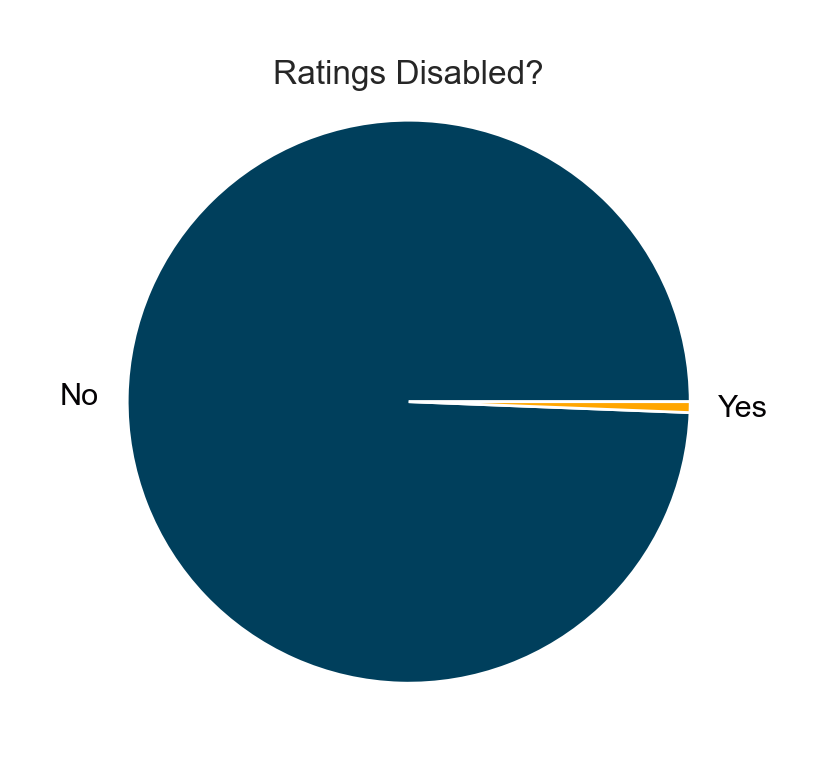

In [57]:
value_counts = df["ratings_disabled"].value_counts().to_dict()
fig, ax = plt.subplots()
_ = ax.pie([value_counts[False], value_counts[True]], labels=['No', 'Yes'], 
            colors=['#003f5c', '#ffa600'], textprops={'color': '#040204'})
_ = ax.axis('equal')
_ = ax.set_title('Ratings Disabled?')

In [58]:
df["ratings_disabled"].value_counts()

False    22385
True       139
Name: ratings_disabled, dtype: int64

#### We see that only 139 trending videos out of 22385 prevented users from rating.

### How many videos have both comments and ratings disabled?

In [59]:
len(df[(df["comments_disabled"] == True) & (df["ratings_disabled"] == True)].index)

80

#### So there are just 80 trending videos that have both comments and ratings disabled.

### Trending videos and their publishing day and time.

In [60]:
df["publishing_day"] = df["publish_time"].apply(
    lambda x: datetime.datetime.strptime(x[:10], "%Y-%m-%d").date().strftime('%a'))
df["publishing_hour"] = df["publish_time"].apply(lambda x: x[11:13])
df.drop(labels='publish_time', axis=1, inplace=True)

#### which days of the week had the largest numbers of trending videos

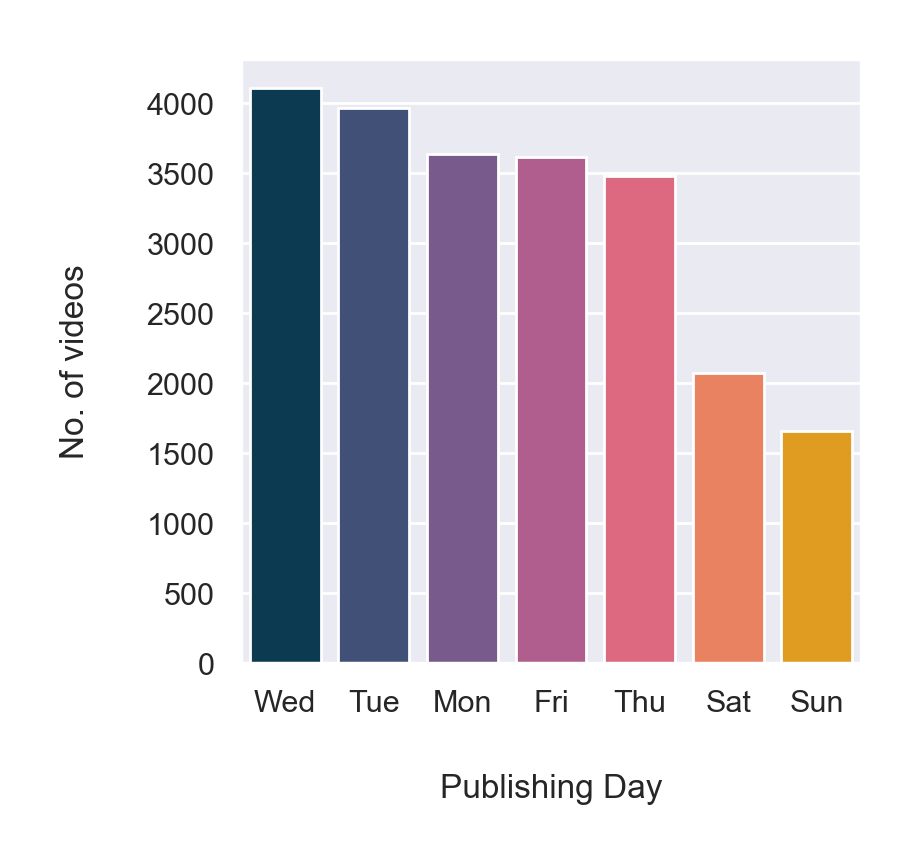

In [61]:
cdf = df["publishing_day"].value_counts()\
        .to_frame().reset_index().rename(columns={"index": "publishing_day", "publishing_day": "No_of_videos"})
fig, ax = plt.subplots()
_ = sns.barplot(x="publishing_day", y="No_of_videos", data=cdf, 
                palette=sns.color_palette(['#003f5c', '#374c80', '#7a5195', 
                                           '#bc5090', '#ef5675', '#ff764a', '#ffa600'], n_colors=7), ax=ax)
_ = ax.set(xlabel="Publishing Day", ylabel="No. of videos")
plt.savefig('../Documents/youtubedata (2)/day.png', dpi=300)

In [62]:
cdf

,publishing_day,No_of_videos
0,Wed,4109
1,Tue,3962
2,Mon,3633
3,Fri,3613
4,Thu,3478
5,Sat,2073
6,Sun,1656


#### the number of trending videos published on Sunday are less than the number of trending videos published on other days of the week.

#### which hour had the largest numbers of trending videos

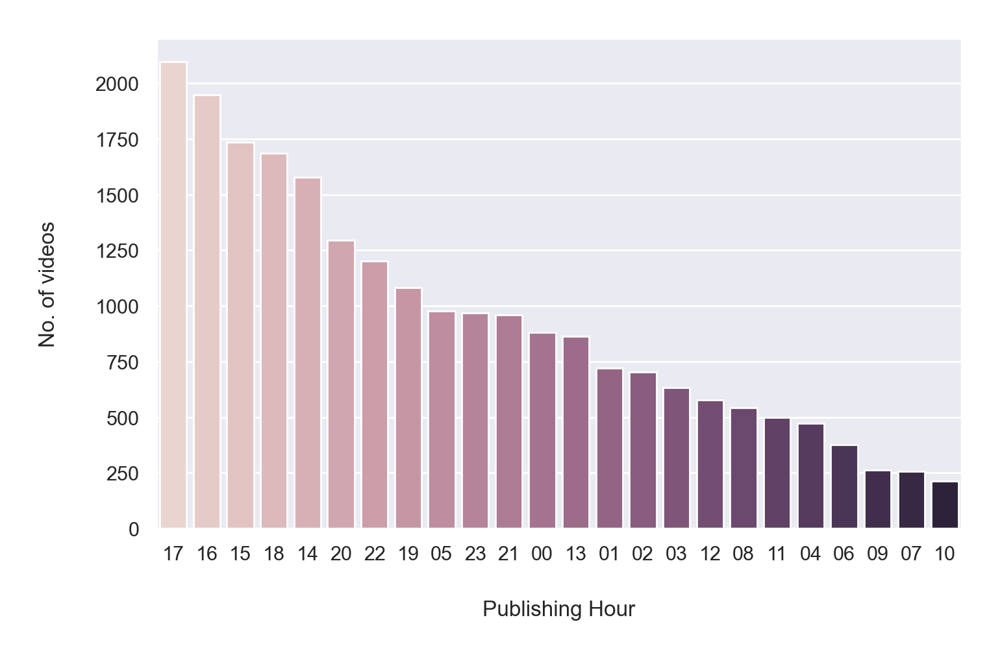

In [63]:
cdf = df["publishing_hour"].value_counts().to_frame().reset_index()\
        .rename(columns={"index": "publishing_hour", "publishing_hour": "No_of_videos"})
sns.set(rc={'figure.figsize':(8,5)})
fig, ax = plt.subplots()
_ = sns.barplot(x="publishing_hour", y="No_of_videos", data=cdf, 
                palette=sns.cubehelix_palette(n_colors=24), ax=ax)
_ = ax.set(xlabel="Publishing Hour", ylabel="No. of videos")
plt.savefig('../Documents/youtubedata (2)/time.png', dpi=300)

#### we can see that the time between 2pm-5pm, peaking between 4pm and 5pm had largest number of trending videos. And the time between 6am-10am has the least number of trending videos with a slight increase at 8am in particular.

In [64]:
df['trending_date'] = pd.to_datetime(df['trending_date'], format="%y.%d.%m")

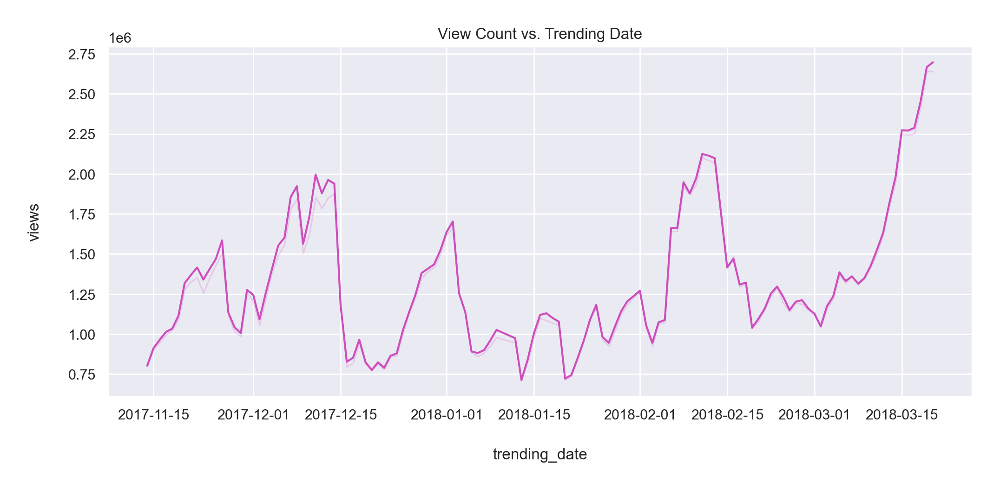

In [65]:
sns.set(rc={'figure.figsize':(12,5)})
ax= sns.lineplot(x='trending_date', y='views', data=df, ci=False, color='#CE4DBD')
plot.title('View Count vs. Trending Date')
plt.savefig('../Documents/youtubedata (2)/trending_date.png', dpi=300)

#### Views are really high after the 15th of March,2018 compared to all trending dates. And the least views observed around the 15th of January,2018.

### how many trending videos got removed or had some error

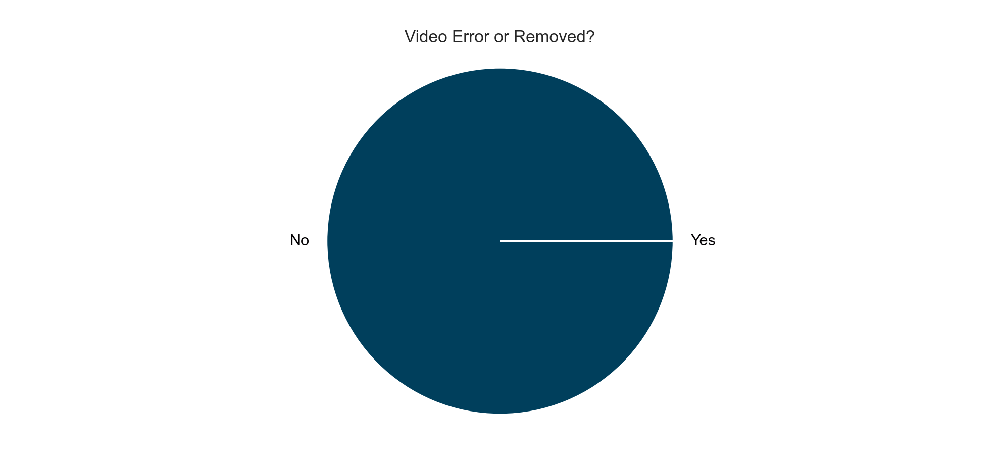

In [66]:
value_counts = df["video_error_or_removed"].value_counts().to_dict()
fig, ax = plt.subplots()
_ = ax.pie([value_counts[False], value_counts[True]], labels=['No', 'Yes'], 
        colors=['#003f5c', '#ffa600'], textprops={'color': '#040204'})
_ = ax.axis('equal')
_ = ax.set_title('Video Error or Removed?')

In [67]:
df["video_error_or_removed"].value_counts()

False    22520
True         4
Name: video_error_or_removed, dtype: int64

#### there is a tiny portion (4 videos) with errors.

### Views Distribution according to State and City.

Text(0, 0.5, 'Views')

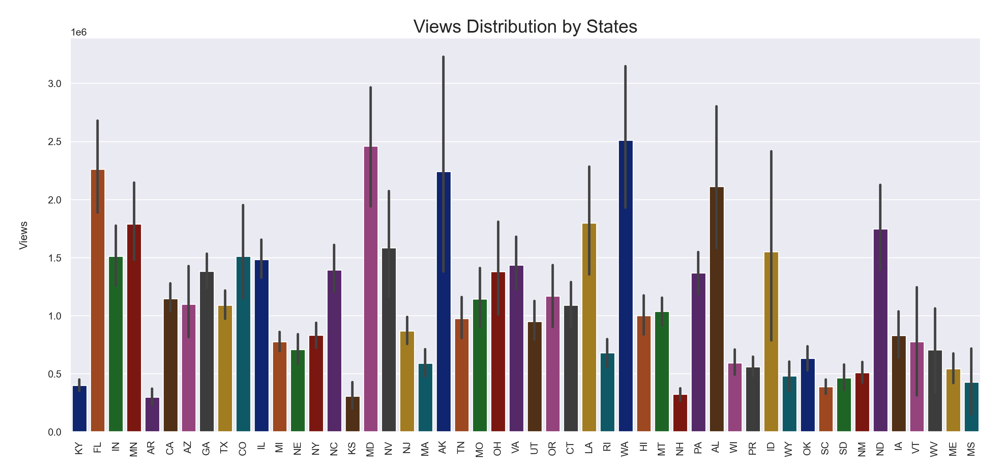

In [68]:
plt.figure(figsize = (18,8))
# Views distribution that shows watch rates of category names
g_v = sns.barplot(x="STATE", y="views", data=df, palette="dark")
g_v.set_xticklabels(g_v.get_xticklabels(),rotation=90)
g_v.set_title("Views Distribution by States", fontsize=20)
g_v.set_xlabel("", fontsize=12)
g_v.set_ylabel("Views", fontsize=12)

Text(0, 0.5, 'Views')

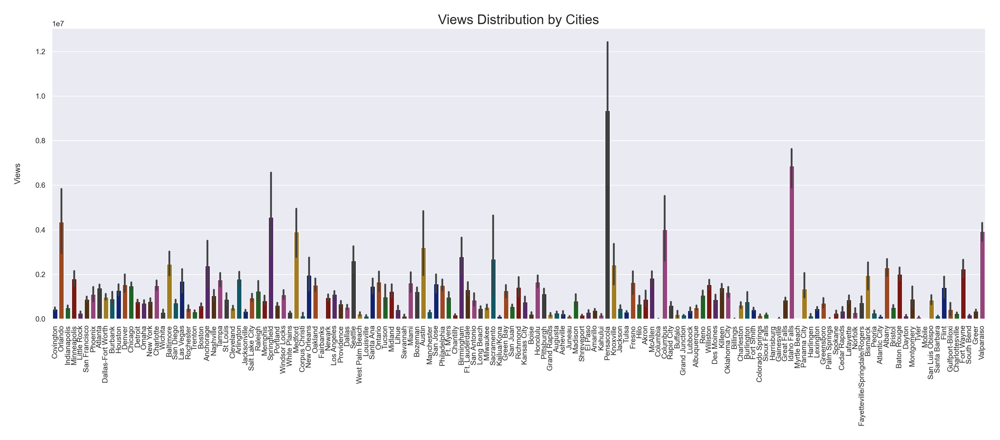

In [69]:
plt.figure(figsize = (25,8))
# Views distribution that shows watch rates of category names
g_v = sns.barplot(x="CITY", y="views", data=df, palette="dark")
g_v.set_xticklabels(g_v.get_xticklabels(),rotation=90)
g_v.set_title("Views Distribution by Cities", fontsize=20)
g_v.set_xlabel("", fontsize=12)
g_v.set_ylabel("Views", fontsize=12)

#### The most number of vies comes from the state of WA and city with large number of vies is Pensacola.

In [70]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Sushree\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [71]:
sia = SentimentIntensityAnalyzer()
df_dummy["Sentiment Scores"] = df_dummy["tags"].apply(lambda x: sia.polarity_scores(x)["compound"])
df_dummy.head(3)

,CITY,STATE,COUNTRY,trending_date,title,Channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,Category Name,Sentiment Scores
0,Covington,KY,USA,18.25.02,Cheap Thrills - Sia / Tina Boo Choreography,1MILLION Dance Studio,24.00,2018-02-19T12:00:02.000Z,"choreography""|""1million dance studio""|""ìë°ë...",601159.00,27962.00,336.00,444.00,https://i.ytimg.com/vi/QRq0pkr2TWM/default.jpg,False,False,False,Entertainment,0.00
1,Covington,KY,USA,18.26.02,Cheap Thrills - Sia / Tina Boo Choreography,1MILLION Dance Studio,24.00,2018-02-19T12:00:02.000Z,"choreography""|""1million dance studio""|""ìë°ë...",627933.00,28580.00,340.00,444.00,https://i.ytimg.com/vi/QRq0pkr2TWM/default.jpg,False,False,False,Entertainment,0.00
2,Covington,KY,USA,18.01.03,FRIENDS - Marshmello & Anne-Marie / Tina Boo C...,1MILLION Dance Studio,24.00,2018-02-28T09:00:03.000Z,"choreography""|""1million dance studio""|""ìë°ë...",384249.00,26271.00,238.00,540.00,https://i.ytimg.com/vi/_xwX82Y0Oro/default.jpg,False,False,False,Entertainment,0.00


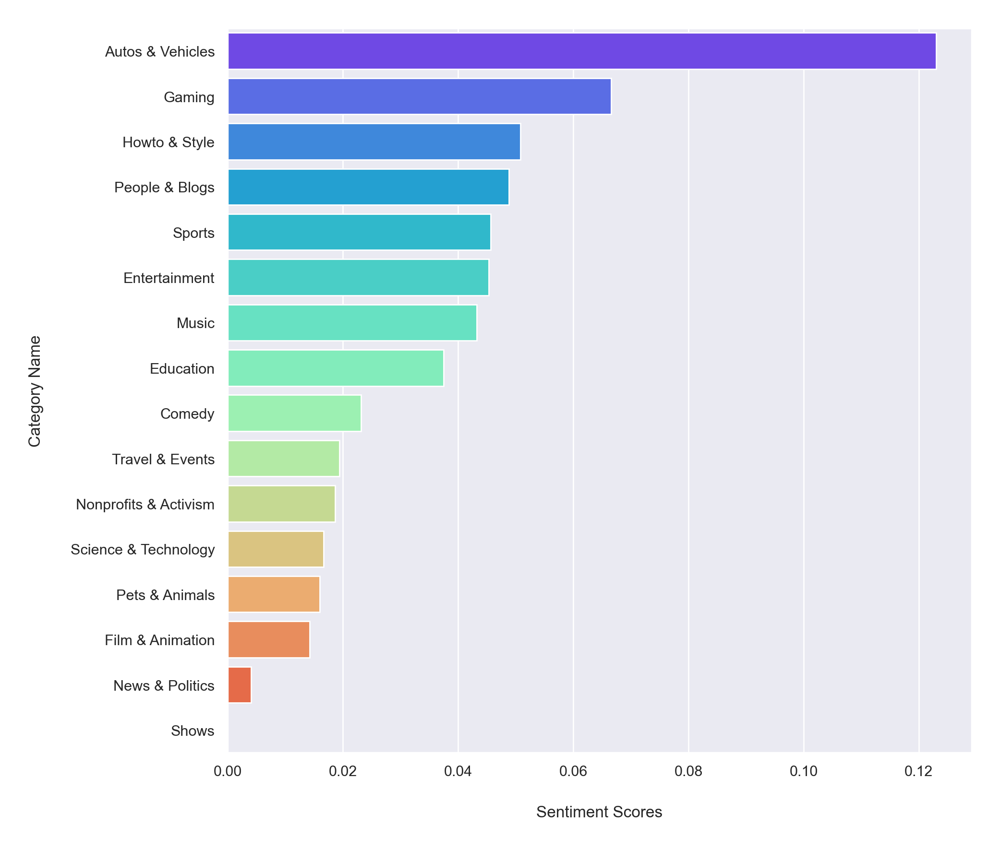

In [72]:
DataGrp =  df_dummy.groupby(['Category Name'])
DataGrpDF = DataGrp.mean()
DataGrpDF.sort_values(by=['Sentiment Scores'], inplace=True, ascending=False)

DataGrpDF = DataGrpDF.reset_index()
fig, ax = plt.subplots(figsize=(10,10))   
sns.barplot(x="Sentiment Scores", y="Category Name", data=DataGrpDF,palette='rainbow')
plt.savefig('../Documents/youtubedata (2)/senti.png', dpi=300)

#### Tags of videos of certain catagories are perhaps unsurprisingly more positive than others, for instance it is intuitive to see why Auto and Vehicles, which often are used to depict a glamourous view would have a more positive description than News and Politics which often describe an story in an unfavourable way dependending on the poltical affiliation of the channel and their respective values allign with the story they are describing.